In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/gdrive


In [ ]:
master_path = "/content/drive/My Drive/Colab Notebooks/EEG-GAN/Dataset/cho_et_al_data/"
data_paths = {
              'raw': "raw/",
              'preprocessed': "preprocessed/", 
              'saved_models': "saved_models/", 
              'vaes': "vaes/", 
              'gans': "gans/", 
              'timing': 'timing/',
              'prediction_models': "prediction_models/",
              'SYNTH_RANDAVG_RAW': "SYNTH_RANDAVG_RAW/", 
              'SYNTH_RANDRECOMB_RAW': "SYNTH_RANDRECOMB_RAW/", 
              'SYNTH_RANDRECOMB_FREQ':  "SYNTH_RANDRECOMB_FREQ/",
              'SYNTH_NOISE': "SYNTH_NOISE/", 
              'SYNTH_VAE': "SYNTH_VAE/", 
              'SYNTH_GAN': "SYNTH_GAN/", 
              'SYNTH_CROPS': "SYNTH_CROPS/", 
              }

In [ ]:
#@title Kaggle Utils
from google.colab import files
data_to_load = files.upload()

!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
kaggle.json


In [ ]:
!kaggle datasets download -d tanviranjumuu/cho0-data --unzip
!rm cho0-data.zip

100% 9.92G/9.93G [01:50<00:00, 133MB/s]
100% 9.93G/9.93G [01:51<00:00, 96.1MB/s]
rm: cannot remove 'cho0-data.zip': No such file or directory


In [ ]:
!pip install spkit

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.2 MB/s eta 0:00:00


# Imports

In [ ]:
import numpy as np
import scipy.io as sio
import spkit as sp
import matplotlib.pyplot as plt
import glob

In [ ]:
electrodes = ['FP1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3',' FC1', 'C1', 'C3','C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1','P1','P3', 'P5', 'P7', 'P9', 'RO7', 'PO3', 'O1', 'Iz','Oz','POz', 'Pz', 'CPZ', 'FPZ', 'FP2', 'AF8', 'AF4', 'AFZ','FZ', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz','Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10','PO8', 'PO4', 'O2','EMG1','EMG2','EMG3','EMG4']
electrodes.reverse()

In [ ]:
files = glob.glob('/content/EEG_MI/*.mat')
mat = sio.loadmat(files[0])

In [ ]:
list(mat.keys())

['__header__', '__version__', '__globals__', 'eeg']

# Functions

In [ ]:
def struct2dict(mat):
  data = dict()
  key = list(mat.keys())[-1]
  for i in range(len(mat[key][0,0])):
    data[mat[key][0,0].dtype.descr[i][0]] = mat[key][0,0][i]
  return data

In [ ]:
def channel_normalize(data):
  mean = data.mean(axis = 0).reshape(1,-1) 
  diff = (data.max(axis = 0)- data.min(axis = 0)).reshape(1,-1) 
  data = (data - mean)/diff
  return data

In [ ]:
def normalize(data):
  mean = data.mean()
  diff = data.max()- data.min()
  data = (data - mean)/diff
  return data

In [ ]:
def show_eeg_signal(Xf, ch_names, fs, seconds, sensitivity, spacing, mode = 'norm'):
  Xf = Xf[:,:seconds*fs].T
  if mode == 'max':
    Xf = normalize(Xf)*sensitivity
  else:
    Xf = channel_normalize(Xf)*sensitivity
  ch_len = Xf.shape[1]
  print(ch_len)
  t = np.arange(seconds*fs)
  plt.figure(figsize=(5*seconds,ch_len))
  plt.plot(t,Xf+np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing)
  plt.xlim([t[0],t[-1]])
  plt.xlabel('time (sec)')
  plt.yticks(np.arange(-int(np.ceil(ch_len/2)),int(np.floor(ch_len/2)))*spacing,ch_names)
  plt.grid()
  plt.title('Xf: 14 channel - EEG Signal')
  plt.show()

In [ ]:
def ICA_decompose(data, algo = 'fastica'):
  ICA = sp.ICA(n_components= None, method = algo)
  ICA.fit(data)
  x = ICA.transform(data)
  return x

In [ ]:
data = struct2dict(mat)
data.keys()

dict_keys(['noise', 'rest', 'srate', 'movement_left', 'movement_right', 'movement_event', 'n_movement_trials', 'imagery_left', 'imagery_right', 'n_imagery_trials', 'frame', 'imagery_event', 'comment', 'subject', 'bad_trial_indices', 'psenloc', 'senloc'])

In [ ]:
X = data['movement_right']

In [ ]:
icap = ['ICA'+str(i) for i in range(1,69)]

In [ ]:
X_fastICA = ICA_decompose(X, algo = 'fastica')
X_infomax = ICA_decompose(X, algo = 'infomax')
X_picard = ICA_decompose(X,algo = 'picard')
X_ext_infomax = ICA_decompose(X,algo = 'extended-infomax')

68


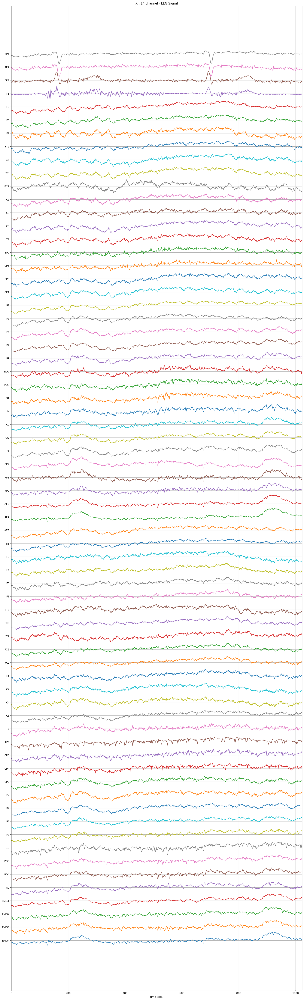

In [ ]:
show_eeg_signal(X, electrodes, 512, 2, 8,8)

68


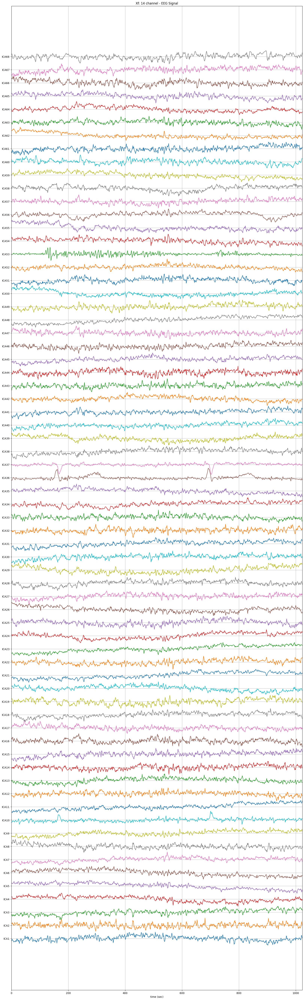

In [ ]:
show_eeg_signal(X_fastICA, icap, 512, 2, 8,8)

In [ ]:
X_infomax

array([[ 1.26320383e+08,  1.26305521e+08,  1.26314341e+08, ...,
         1.28752247e+08,  1.28530927e+08,  1.28511879e+08],
       [ 1.54975405e+08,  1.55041705e+08,  1.54871771e+08, ...,
         1.54043179e+08,  1.54163345e+08,  1.54212802e+08],
       [ 1.88341187e+08,  1.88384952e+08,  1.88316652e+08, ...,
         1.92240967e+08,  1.92259113e+08,  1.92268566e+08],
       ...,
       [ 3.79837679e+08,  3.79693725e+08,  3.79808330e+08, ...,
         3.78989581e+08,  3.79077603e+08,  3.79251620e+08],
       [ 1.07514825e+08,  1.07572208e+08,  1.07400999e+08, ...,
         1.08701481e+08,  1.08758557e+08,  1.08603818e+08],
       [-1.74315193e+08, -1.74357853e+08, -1.74333804e+08, ...,
        -1.74567086e+08, -1.74474601e+08, -1.74470569e+08]])

68


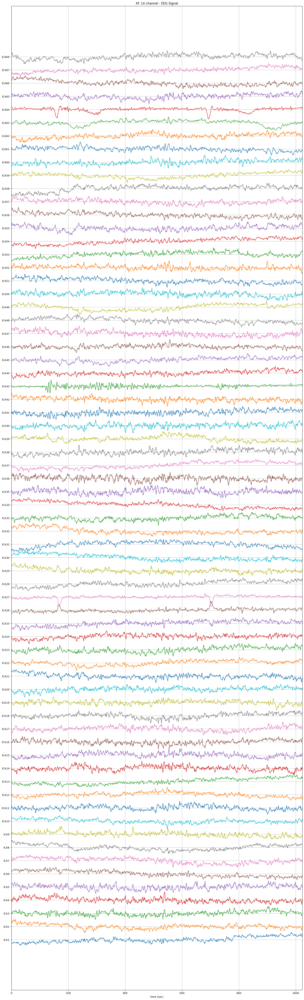

In [ ]:
show_eeg_signal(X_infomax, icap, 512, 2, 8,8, mode = 'norm')

In [ ]:
def sklearn_ICA(X, n_comp):
  from sklearn.decomposition import FastICA
  transformer = FastICA(n_components = n_comp, random_state=3, whiten='arbitrary-variance')
  x = transformer.fit_transform(X = X)
  return x

In [ ]:
sk_x = sklearn_ICA(X.T, 14)

In [ ]:
sk_x.shape


(71680, 14)

14


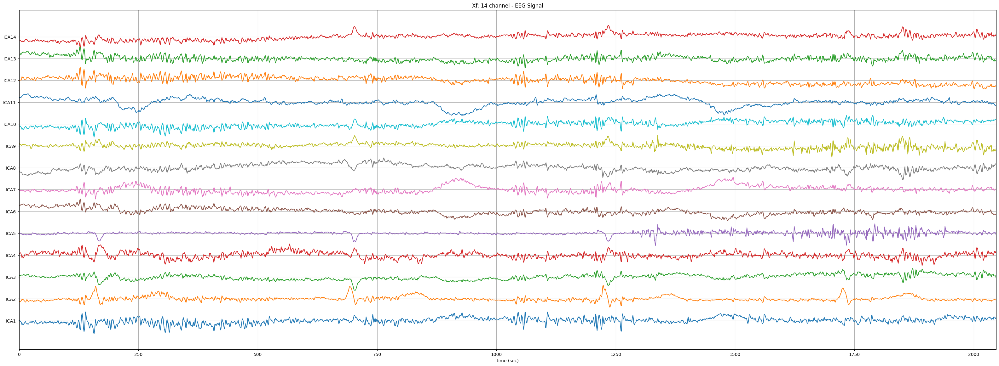

In [ ]:
icap = ['ICA'+str(i) for i in range(1,15)]
show_eeg_signal(sk_x.T, icap, 512, 4, 2,2, mode = 'any')

In [ ]:
ch_names = ['AF3','F7','F3','FC5','T7','P7','O1','O2','P8','T8','FC6','F4','F8','AF4']
pos, ch1 = sp.eeg.s1020_get_epos2d_(ch_names, reorder=False)
sp.eeg.TopoMap(pos, X[:14,12] ,res=512, showplot=True,axes=None,contours=True,showsensors=True,
            interpolation=None,shownames=True, ch_names=ch_names,showhead=True,vmin=None,vmax=None,
            returnIm = False,fontdict=None)

In [ ]:
def remove_artifact(data, algorithm = '')

array([[  -9773.996,   -9950.996,  -10090.496, ...,  -22106.746,
         -22166.996,  -22216.246],
       [-168767.25 , -168754.5  , -168889.75 , ..., -163419.75 ,
        -163782.   , -164061.25 ],
       [-168224.25 , -168037.5  , -168162.75 , ..., -162429.25 ,
        -162780.75 , -163303.5  ],
       ...,
       [-719714.5  , -718988.   , -719596.25 , ..., -660799.25 ,
        -660619.25 , -660437.5  ],
       [-332291.75 , -331581.75 , -331913.75 , ..., -289568.   ,
        -288917.5  , -288914.5  ],
       [-273509.   , -272688.75 , -273369.25 , ..., -270517.75 ,
        -269969.5  , -269998.5  ]], dtype=float32)

In [ ]:
data['movement_right'].shape

(68, 71680)

In [ ]:
data.keys()

dict_keys(['noise', 'rest', 'srate', 'movement_left', 'movement_right', 'movement_event', 'n_movement_trials', 'imagery_left', 'imagery_right', 'n_imagery_trials', 'frame', 'imagery_event', 'comment', 'subject', 'bad_trial_indices', 'psenloc', 'senloc'])

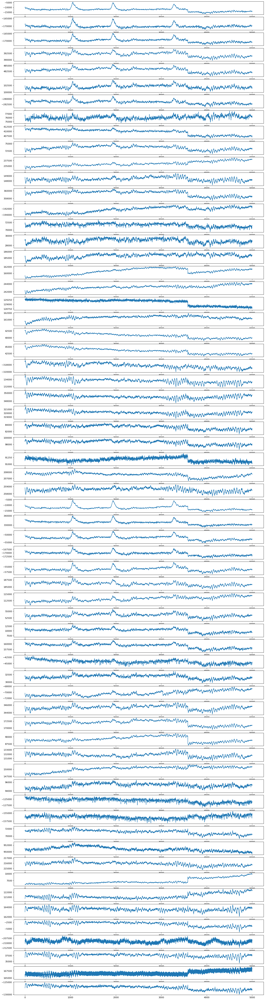

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(20, 80), dpi=80)
for i in range(64):
  plt.subplot(64,1,i+1)
  plt.plot(data['movement_left'][i][0:5000])


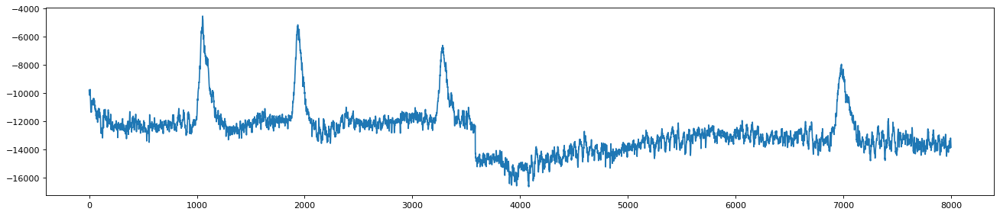

In [ ]:
figure(figsize=(20, 4), dpi=80)
plt.plot(data['movement_left'][0][0:8000])

In [ ]:
print(FastICA.__doc__)

In [ ]:
from sklearn.decomposition import FastICA
n_comp = 30
transformer = FastICA(n_components = n_comp, random_state=3, whiten='unit-variance')
x = transformer.fit_transform(X = data['movement_left'].T)

In [ ]:
x.shape

(71680, 11)

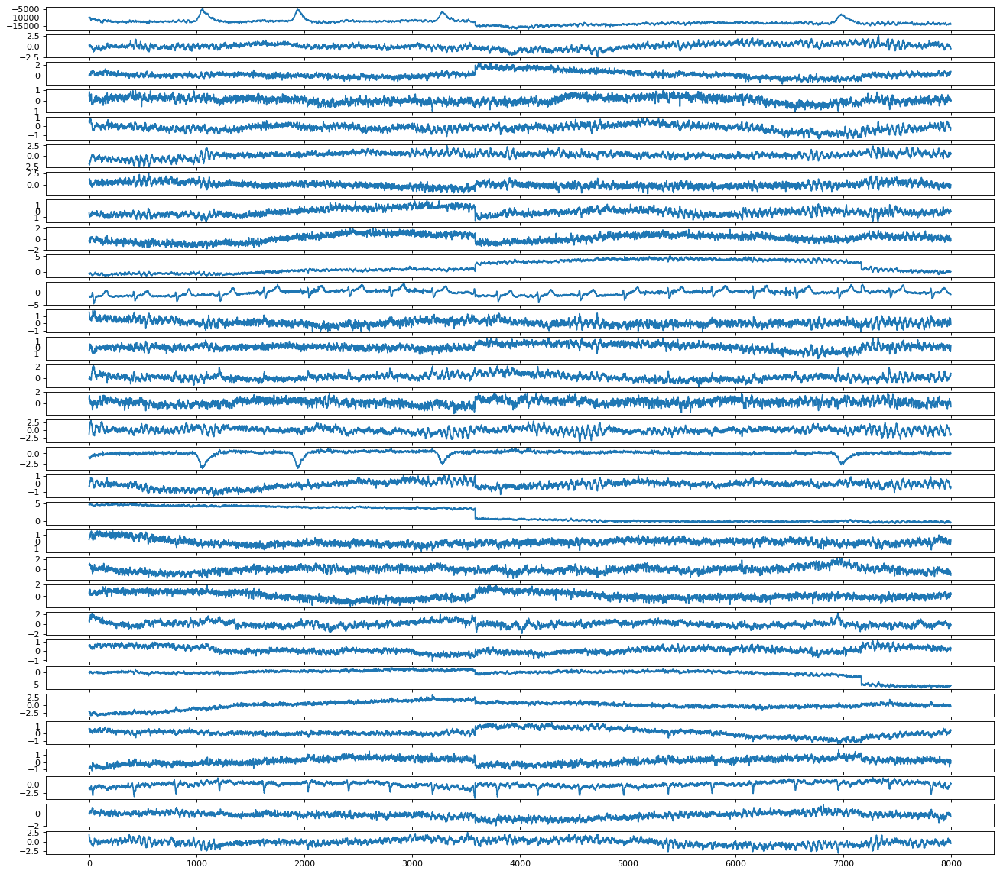

In [ ]:
start = 0
end = 8000
figure(figsize=(20, 18), dpi=80)
plt.subplot(n_comp+1,1,1)
plt.plot(data['movement_left'][0][start:end])
for i in range(n_comp):
  plt.subplot(n_comp+1,1,i+2)
  plt.plot(x[start:end,i])

In [ ]:
XR = sp.eeg.ICA_filtering(data['movement_left'].T.copy(),verbose=1,winsize=128)

ICA Artifact Removal : extended-infomax

Done..


In [ ]:
XR.shape

(71680, 68)

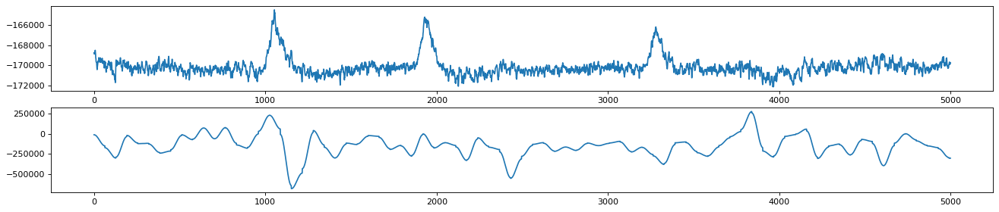

In [ ]:
figure(figsize=(20, 4), dpi=80)
plt.subplot(211)
plt.plot(data['movement_left'][1,0:5000])
plt.subplot(212)
plt.plot(XR[0:5000,1])